# Quiz 3

In [1]:
import random, math
N = 20
position = 0
weight = [math.sin(k) + 1.5 for k in range(N)]
pos_list = [] 
for iter in range(1000000):
    dir = random.choice([-1, 1])
    new_position = (position + dir) % N
    if random.uniform(0.0, 1.0) < weight[position] / weight[new_position]:
        position = new_position
    pos_list.append(position)

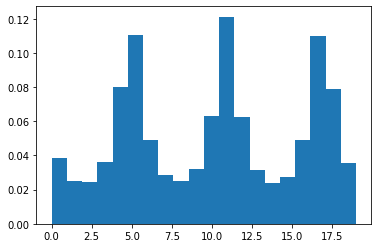

In [6]:
import matplotlib.pyplot as plt
plt.figure()
plt.hist(pos_list, bins=20, density=True)
plt.show()

In [11]:
import random, math
N = 20; position = 0
weight = [math.sin(k) + 1.5 for k in range(N)]
pos_list = [] 
for iter in range(1000000):
    Upsilon = random.uniform(0.0, 1.0)
    if Upsilon < 0.5: 
        new_position = (position + 1) % N
        if random.uniform(0.0, 1.0) < weight[new_position] / weight[position]: 
            position = new_position
        pos_list.append(position)

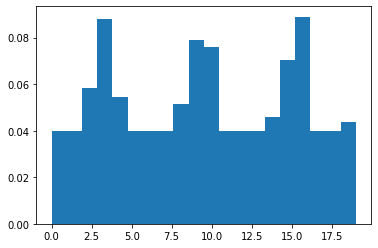

In [12]:
plt.figure()
plt.hist(pos_list, bins=20, density=True)
plt.show()

In [13]:
import random, math
N = 20; position = 0
weight = [math.sin(k) + 1.5 for k in range(N)]
pos_list = []
for iter in range(1000000):
    Upsilon = random.uniform(0.0, 1.0)
    if Upsilon < 0.5: 
        new_position = (position + 1) % N
        if random.uniform(0.0, 1.0) < weight[position] / weight[new_position]: 
            position = new_position
    pos_list.append(position)

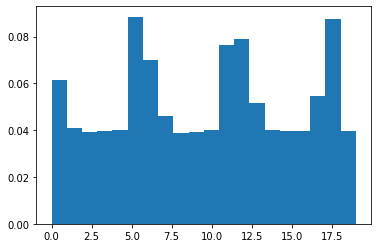

In [14]:
plt.figure()
plt.hist(pos_list, bins=20, density=True)
plt.show()

In [15]:
import random, math
N = 20; position = 0
weight = [math.sin(k) + 1.5 for k in range(N)]
pos_list = [] 
for iter in range(1000000):
    Upsilon = random.uniform(0.0, 1.0)
    if Upsilon < 0.5: 
        new_position = (position + 1) % N
        if random.uniform(0.0, 1.0) < weight[new_position] / weight[position]: 
            position = new_position
    pos_list.append(position)

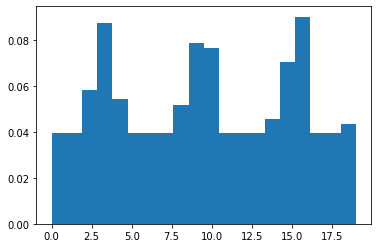

In [16]:
plt.figure()
plt.hist(pos_list, bins=20, density=True)
plt.show()

# Lecture 4

**Museum code**  
`direct_sphere_3d.py`

In [ ]:
import random, math

nsamples = 100
for sample in range(nsamples):
    x, y, z = (random.gauss(0.0, 1.0),
               random.gauss(0.0, 1.0),
               random.gauss(0.0, 1.0))
    length = random.uniform(0.0, 1.0) ** (1.0 / 3.0) \
                    / math.sqrt(x ** 2 + y ** 2 + z ** 2)
    print(x * length, y * length, z * length)

`direct_surface_3d.py`

In [ ]:
import random, math

nsamples = 50
for sample in range(nsamples):
    x, y, z = (random.gauss(0.0, 1.0),
               random.gauss(0.0, 1.0),
               random.gauss(0.0, 1.0))
    radius = math.sqrt(x ** 2 + y ** 2 + z ** 2)
    print(x / radius, y / radius, z / radius)

# Tutorial 4

In [38]:
import random, pylab
 
N = 5
pi = [[1.1 / 5.0, 0], [1.9 / 5.0, 1], [0.5 / 5.0, 2], [1.25 / 5.0, 3], [0.25 / 5.0, 4]]
x_val = [a[1] for a in pi]
y_val = [a[0] for a in pi]
pi_mean = sum(y_val) / float(N)
long_s = []
short_s = []
for p in pi:
    if p[0] > pi_mean:
        long_s.append(p)
    else:
        short_s.append(p)
table = []

In [32]:
pi_mean

0.2

In [33]:
long_s

[[0.22000000000000003, 0], [0.38, 1], [0.25, 3]]

In [34]:
short_s

[[0.1, 2], [0.05, 4]]

In [35]:
a = long_s.pop()

In [36]:
a, long_s

([0.25, 3], [[0.22000000000000003, 0], [0.38, 1]])

In [37]:
long_s.append(a)

In [39]:
for k in range(N - 1):
    e_plus = long_s.pop()
    e_minus = short_s.pop()
    table.append((e_minus[0], e_minus[1], e_plus[1]))
    e_plus[0] = e_plus[0] - (pi_mean - e_minus[0])
    if e_plus[0] < pi_mean:
        short_s.append(e_plus)
    else:
        long_s.append(e_plus)

In [40]:
table

[(0.05, 4, 3),
 (0.09999999999999998, 3, 1),
 (0.1, 2, 1),
 (0.17999999999999997, 1, 0)]

In [41]:
long_s

[]

In [42]:
short_s

[[0.19999999999999998, 0]]

# Lecture 6

Levi free-path animation

In [63]:
%matplotlib inline

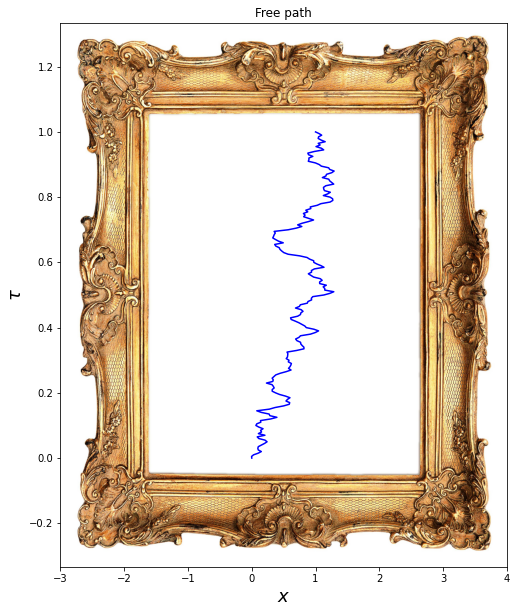

In [30]:
import math, random
import pylab
from matplotlib.animation import FuncAnimation

from tensorflow import keras
from matplotlib import image as mp_image

img_url = 'https://i.pinimg.com/originals/38/04/25/380425e4ab067cbec44e1c8f2437d2dd.jpg'
img_path = keras.utils.get_file("frame.jpg", img_url)

img = mp_image.imread(img_path)
  
beta = 1.0
N = 200
dtau = beta / N
nsteps = 20                      # number of paths to be generated
xstart, xend = 0.0, 1.0          # initial and final points

x = [0]*(N+1)
y = [j * dtau for j in range(N + 1)]
# graphics
fig = pylab.figure(figsize=(8, 10))
pylab.imshow(img, aspect='auto', origin='lower', extent=[-3, 4, 0-beta/3, beta+beta/3])
line, = pylab.plot(x, y, 'b-')
pylab.xlabel('$x$', fontsize=18)
pylab.ylabel('$\\tau$', fontsize=18)
pylab.title('Free path')
pylab.xlim(-3.0, 4.0)

def update(step):
    #for step in range(nsteps):
    x = [xstart]
    for k in range(1, N):        # loop over internal slices
        dtau_prime = (N - k) * dtau
        x_mean = (dtau_prime * x[k - 1] + dtau * xend) / \
                 (dtau + dtau_prime)
        sigma = math.sqrt(1.0 / (1.0 / dtau + 1.0 / dtau_prime))
        x.append(random.gauss(x_mean, sigma))
    x.append(xend)
    line.set_data(x, y)
    return line,
    
anim = FuncAnimation(fig, update, frames=[i for i in range(nsteps)])
HTML(anim.to_jshtml())

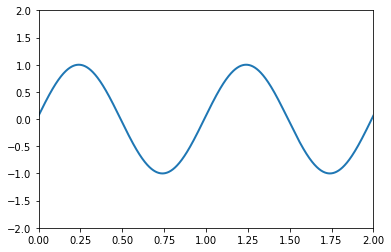

In [6]:
import numpy as np
import matplotlib.pyplot as plt

from matplotlib import animation, rc
from IPython.display import HTML

# First set up the figure, the axis, and the plot element we want to animate
fig, ax = plt.subplots()

ax.set_xlim(( 0, 2))
ax.set_ylim((-2, 2))

line, = ax.plot([], [], lw=2)

# initialization function: plot the background of each frame
def init():
    line.set_data([], [])
    return (line,)

# animation function. This is called sequentially
def animate(i):
    x = np.linspace(0, 2, 1000)
    y = np.sin(2 * np.pi * (x - 0.01 * i))
    line.set_data(x, y)
    return (line,)

# call the animator. blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=100, interval=20, blit=True)
# equivalent to rcParams['animation.html'] = 'html5'
#rc('animation', html='html5')
#anim

HTML(anim.to_jshtml())  

# HW 6

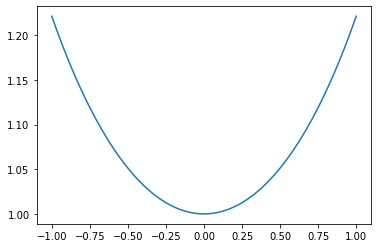

In [37]:
alpha = -0.2
x = [x_i/100. for x_i in range(-100, 101)]
y = [math.exp(-alpha*x_i**2) for x_i in x]
pylab.plot(x, y)
pylab.show()